## Install Package

In [ ]:
!pip install tensorflow scikit-learn opencv-python-headless

## Import Library

In [ ]:
import os
import zipfile
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Dropout, Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

## Mount Google Drive & Ekstrak Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
zip_path = '/content/drive/MyDrive/dataset/dataset_indonesian_food.zip'
extract_path = '/content/dataset/'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
dataset_path = os.path.join(extract_path, 'dataset_indonesian_food')

Mounted at /content/drive


## Data Loading & Preprocessing

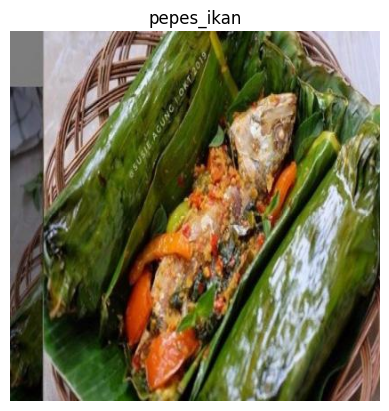

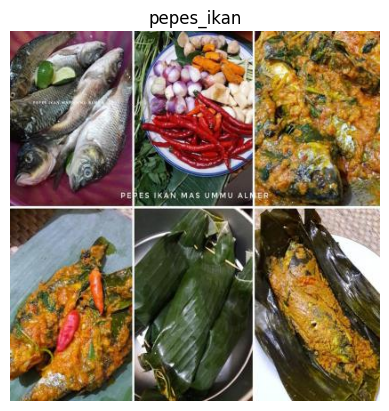

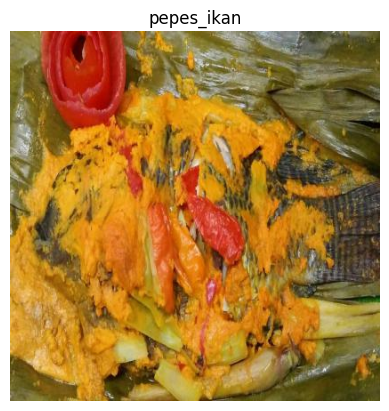

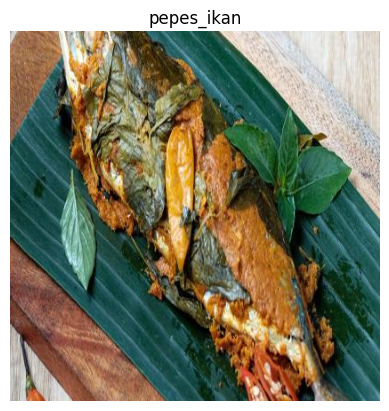

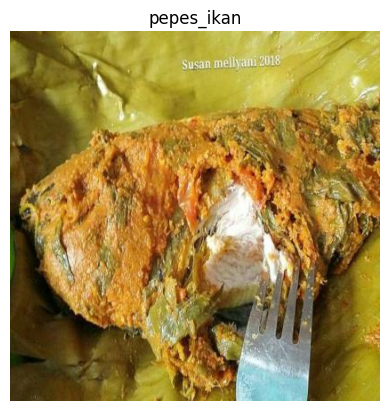

In [ ]:
def display_image_with_label(image_path, label=None):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    if label:
        plt.title(label)
    plt.axis('off')
    plt.show()

def create_labeled_dataset(dataset_path):
    image_paths = []
    labels = []
    for class_folder in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_folder)
        if os.path.isdir(class_path):
            for image_file in os.listdir(class_path):
                if image_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                    image_path = os.path.join(class_path, image_file)
                    image_paths.append(image_path)
                    labels.append(class_folder)
    df = pd.DataFrame({'image_path': image_paths, 'label': labels})
    return df
df = create_labeled_dataset(dataset_path)
for idx, row in df.head(5).iterrows():
    display_image_with_label(row['image_path'], row['label'])

In [ ]:
def preprocess_image(image_path, target_size=(224, 224)):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, target_size)
    img = img.astype(np.float32) / 255.0
    return img
print("\nStatistik Dataset:")
print(f"Total gambar: {len(df)}")
print("\nJumlah gambar per kelas:")
print(df['label'].value_counts())


Statistik Dataset:
Total gambar: 4288

Jumlah gambar per kelas:
label
bakso              181
ayam_goreng        157
gulai_tunjang      119
telur_dadar        116
ayam_pop           113
telur_balado       111
gulai_ikan         111
dendeng_batokok    109
daging_rendang     104
gulai_tambusu      103
kue_cubit          100
seblak             100
risol              100
pepes_ikan         100
bika_ambon         100
mie_ayam           100
kue_lapis          100
dadar_gulung       100
klepon             100
ayam_geprek        100
tempe_bacem        100
ketoprak           100
bakwan             100
gulai_kambing      100
opor_ayam          100
putu_ayu           100
martabak_manis     100
putri_salju         99
serabi              99
bubur_ayam          98
pempek              94
bebek_betutu        81
gudeg               76
papeda              55
tape                55
ayam_bakar          51
mie_goreng          50
rawon               50
nasi_goreng         50
sate                50
gado_gado

Contoh hasil preprocessing gambar:


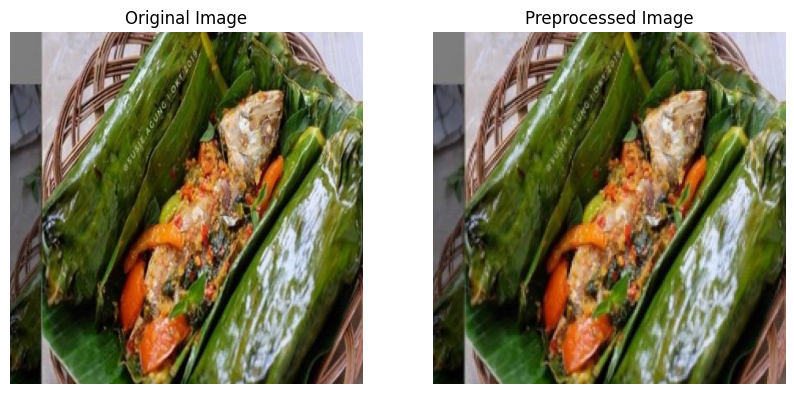

In [ ]:
def visualize_preprocessing(image_path):
    original_img = cv2.imread(image_path)[..., ::-1]
    processed_img = preprocess_image(image_path)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title('Original Image')
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(processed_img)
    plt.title('Preprocessed Image')
    plt.axis('off')
    plt.show()
print("Contoh hasil preprocessing gambar:")
sample_image_path = df['image_path'].iloc[0]
visualize_preprocessing(sample_image_path)

In [ ]:
def save_annotations(df, output_path):
    df.to_csv(output_path, index=False)
    print(f"Anotasi berhasil disimpan ke {output_path}")
save_annotations(df, 'food_annotations.csv')

Anotasi berhasil disimpan ke food_annotations.csv


## Data Split

In [ ]:
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)
val_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_gen = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)
val_gen = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

Found 3430 validated image filenames belonging to 50 classes.
Found 858 validated image filenames belonging to 50 classes.


In [ ]:
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df['label']),
    y=train_df['label']
)
class_weights = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)
]

### Model MobileNetV2

In [ ]:
# Input layer
input_layer = Input(shape=(224, 224, 3))

# Pretrained MobileNetV2
base_model = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_layer)
base_model.trainable = False

# Tambahan layers setelah pretrained
x = base_model.output
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(2, 2)(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(2, 2)(x)

x = GlobalAveragePooling2D()(x)
x = Dense(64, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)  # Dropout lebih besar untuk cegah overfitting

# Output layer
num_classes = df['label'].nunique()
output_layer = Dense(num_classes, activation='softmax')(x)

# Final model
model = Model(inputs=input_layer, outputs=output_layer)

# Compile model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
model.summary()

<ipython-input-12-034e411c2306>:5: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_tensor=input_layer)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 3,081,714 (11.76 MB)

 Trainable params: 823,218 (3.14 MB)

 Non-trainable params: 2,258,496 (8.62 MB)

## Training & Fine-Tuning

### Model MobileNetV2

In [ ]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=100,
    callbacks=callbacks,
    class_weight=class_weights
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.0394 - loss: 4.3400 - val_accuracy: 0.1189 - val_loss: 3.5374 - learning_rate: 1.0000e-04
Epoch 2/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.1191 - loss: 3.4750 - val_accuracy: 0.2832 - val_loss: 3.0330 - learning_rate: 1.0000e-04
Epoch 3/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 293s 3s/step - accuracy: 0.2273 - loss: 3.0687 - val_accuracy: 0.3182 - val_loss: 2.6729 - learning_rate: 1.0000e-04
Epoch 4/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 287s 3s/step - accuracy: 0.2744 - loss: 2.7421 - val_accuracy: 0.3881 - val_loss: 2.4620 - learning_rate: 1.0000e-04
Epoch 5/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 290s 3s/step - accuracy: 0.3325 - loss: 2.5032 - val_accuracy: 0.4417 - val_loss: 2.2889 - learning_rate: 1.0000e-04
Epoch 6/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 284s 3s/step - accuracy: 0.3828 - loss: 2.3357 - val_accuracy: 0.5047 - val_loss: 2.0897 - learning_rate: 1.0000e-04
Epoch 7/100
108/108 ━━━━━━━━━━━━━━━━━━━━ 328s 3s/ste

## Evaluasi Model

### Model MobileNetV2

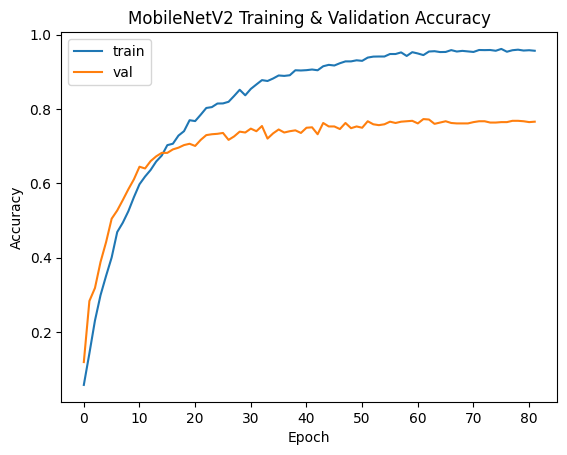

In [ ]:
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='val')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('MobileNetV2 Training & Validation Accuracy')
plt.show()

### Confussion Matrix & Classification Report (MobileNetV2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


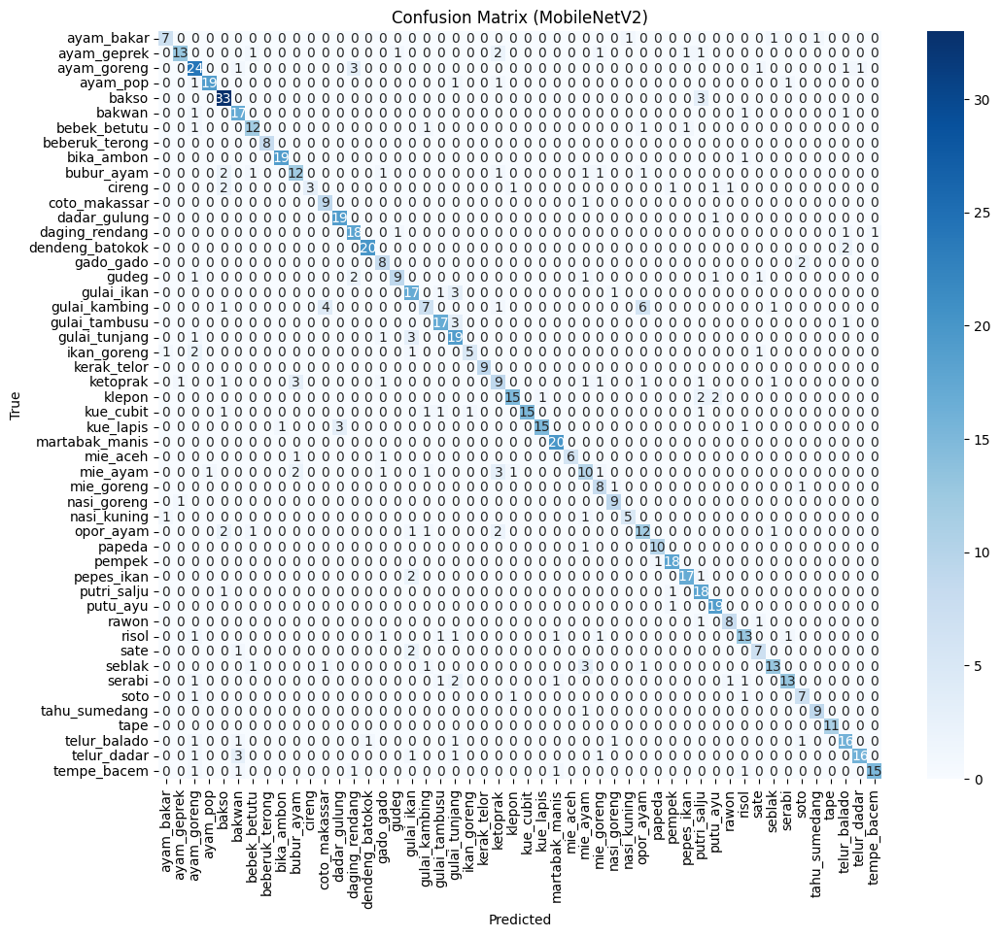


Classification Report (MobileNetV2):
                 precision    recall  f1-score   support

     ayam_bakar       0.78      0.70      0.74        10
    ayam_geprek       0.87      0.65      0.74        20
    ayam_goreng       0.65      0.77      0.71        31
       ayam_pop       0.95      0.83      0.88        23
          bakso       0.77      0.92      0.84        36
         bakwan       0.71      0.85      0.77        20
   bebek_betutu       0.75      0.75      0.75        16
 beberuk_terong       1.00      1.00      1.00         8
     bika_ambon       0.95      0.95      0.95        20
     bubur_ayam       0.67      0.60      0.63        20
         cireng       1.00      0.33      0.50         9
  coto_makassar       0.64      0.90      0.75        10
   dadar_gulung       0.86      0.95      0.90        20
 daging_rendang       0.75      0.86      0.80        21
dendeng_batokok       0.95      0.91      0.93        22
      gado_gado       0.57      0.80      0.67   

In [ ]:
y_true = []
y_pred = []
class_indices = train_gen.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}
for i in range(len(val_gen)):
    x_batch, y_batch = val_gen[i]
    preds = model.predict(x_batch)
    y_true.extend(np.argmax(y_batch, axis=1))
    y_pred.extend(np.argmax(preds, axis=1))
    if (i+1)*val_gen.batch_size >= val_gen.n:
        break
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(class_indices.keys()), yticklabels=list(class_indices.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (MobileNetV2)')
plt.show()
print('\nClassification Report (MobileNetV2):')
print(classification_report(y_true, y_pred, target_names=list(class_indices.keys())))

In [ ]:
def predict_image(image_path, model, class_indices):
    img = preprocess_image(image_path)
    pred = model.predict(np.expand_dims(img, axis=0))[0]
    idx_to_class = {v: k for k, v in class_indices.items()}
    pred_idx = np.argmax(pred)
    pred_label = idx_to_class[pred_idx]
    confidence = pred[pred_idx]
    return pred_label, confidence

## Inference

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/st

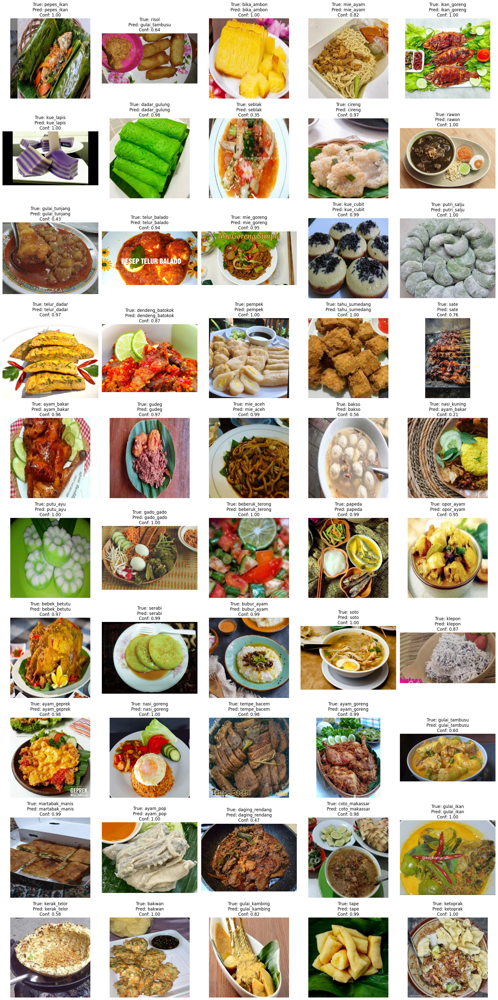

In [ ]:
num_classes = len(df['label'].unique())
rows, cols = 10, 5
fig, axes = plt.subplots(rows, cols, figsize=(20, 40))
axes = axes.flatten()
for idx, label in enumerate(df['label'].unique()):
    if idx >= rows * cols:
        break
    sample_row = df[df['label'] == label].iloc[0]
    image_path = sample_row['image_path']
    pred_label, confidence = predict_image(image_path, model, train_gen.class_indices)
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    axes[idx].imshow(img)
    axes[idx].set_title(f"True: {label}\nPred: {pred_label}\nConf: {confidence:.2f}")
    axes[idx].axis('off')
for i in range(idx + 1, rows * cols):
    axes[i].axis('off')
plt.tight_layout()
plt.show()

In [ ]:
print(df['label'].nunique())
print(len(train_gen.class_indices))
print(train_gen.class_indices)

50
50
{'ayam_bakar': 0, 'ayam_geprek': 1, 'ayam_goreng': 2, 'ayam_pop': 3, 'bakso': 4, 'bakwan': 5, 'bebek_betutu': 6, 'beberuk_terong': 7, 'bika_ambon': 8, 'bubur_ayam': 9, 'cireng': 10, 'coto_makassar': 11, 'dadar_gulung': 12, 'daging_rendang': 13, 'dendeng_batokok': 14, 'gado_gado': 15, 'gudeg': 16, 'gulai_ikan': 17, 'gulai_kambing': 18, 'gulai_tambusu': 19, 'gulai_tunjang': 20, 'ikan_goreng': 21, 'kerak_telor': 22, 'ketoprak': 23, 'klepon': 24, 'kue_cubit': 25, 'kue_lapis': 26, 'martabak_manis': 27, 'mie_aceh': 28, 'mie_ayam': 29, 'mie_goreng': 30, 'nasi_goreng': 31, 'nasi_kuning': 32, 'opor_ayam': 33, 'papeda': 34, 'pempek': 35, 'pepes_ikan': 36, 'putri_salju': 37, 'putu_ayu': 38, 'rawon': 39, 'risol': 40, 'sate': 41, 'seblak': 42, 'serabi': 43, 'soto': 44, 'tahu_sumedang': 45, 'tape': 46, 'telur_balado': 47, 'telur_dadar': 48, 'tempe_bacem': 49}


### Save Model

In [ ]:
model.save('model_indonesian_food.keras')
print("Model berhasil disimpan dalam format Keras: model_indonesian_food.keras")

Model berhasil disimpan dalam format Keras: model_indonesian_food.keras


In [ ]:
model.save('model_indonesian_food.h5')
print("Model berhasil disimpan dalam format HDF5: model_indonesian_food.h5")

Model berhasil disimpan dalam format HDF5: model_indonesian_food.h5


In [ ]:
!pip install tensorflowjs
!tensorflowjs_converter --input_format=keras model_indonesian_food.keras model_tfjs/
print("Model berhasil dikonversi ke format TensorFlow.js")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.5 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-bigquery 3.32.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
2025-05-23 08:37:41.503376: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747989461.558996  102003 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attem